##### top

# FMP modelling for Figure 2

This notebook runs Bayesian models on Datasets 1, 2, 3 and Concatenated Dataset 123 to assess interaction between perception and memory difficulty levels in the FMP. We fit the following formulas to mean score within the condition. Throughout the notebook, I use `task` as a term for memory difficulty levels (M, UD, FD-e), `difficulty` as a term for perceptual difficulty levels (1, 2, 3), and `userID` as a variable denoting individual participants.

* Model task (memory level) and difficulty (perceptual level) interaction with user (participant) as a random effect. Equation:
    * _correct_flt ~ task * difficulty + (1|userID)_
* Model task and difficulty as main effects without interaction with user as a random effect. Equation:
    * _correct_flt ~ task + difficulty + (1|userID)_

The datasets bear the same names as in the article:
* `dataset_1`
* `dataset_2` - randomised stimuli matched for entropy
* `dataset_3` - randomising cue stimulus
* and a new dataset that is a concatenation of the three datasets above -> `concat_datasets_123`

---

* [Models](#Models)
* [Plot results](#Plot-results)
* [Compare all data](#Compare-all-data)
* [Save the inference](#Save-the-inference)

In [1]:
import os, sys
import pickle
from os.path import join as opj
import arviz as az
import bambi as bmb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

az.style.use("arviz-darkgrid")
SEED = 7355608


# Importing module for functions
functions_modul =  "./functions"
sys.path.insert(0, functions_modul)

# import all processing and plotting functions
from bayesian_modelling_functions import fit_model, print_model

path_general = "../"
path_data = opj(path_general, "Data", "datasets")
path_inference_data = opj(path_general, "Data", "model_inference_data")


# set the numer of CPU
num_cpu = min(4, os.cpu_count()-1)
print(f'We will have {num_cpu} cores.\n')


path_dic = {
    'dataset_1' : opj(path_data, 'FMP_dataset_1.csv'),
    'dataset_2': opj(path_data, 'FMP_dataset_2.csv'),
    'dataset_3': opj(path_data, 'FMP_dataset_3.csv'),
    'concat_datasets_123': opj(path_data, 'FMP_concat_datasets_123.csv'),
#     'dataset_4': opj(path_data, 'FMP_dataset_4.csv'),
}


#####
# rename the levels
rename_tasks_dic = {'perception':'Matching', 'perc':'Matching', 'blank':'Unfilled Delay', 'faces':'Filled Delay - emotions', 'math':'Filled Delay - math'}

# define orders
hue_order = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions']
hue_order_math = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions', 'Filled Delay - math']


# load all dataframes
df_dic = {}

# only selected cols
select_cols = ['stim1', 'stim2', 'target', 'RT', 'userID', 'difficulty', 'levels', 'task', 'correct_flt', 'order']


for f in path_dic.keys():   
    if 'longitudinal_' in f or f=='dataset_3':
        df_dic[f] = pd.read_csv(path_dic[f], usecols=select_cols+['target_loc', 'target_loc_simple'])
    else:
        df_dic[f] = pd.read_csv(path_dic[f], usecols=select_cols)
    
    df_dic[f]["Experiment"] = f
    
    # rename the memory task labels in the df
    df_dic[f]['task'] = df_dic[f]['task'].map(rename_tasks_dic).fillna(df_dic[f]['task'])
        

    # clean
    df_dic[f].reset_index(drop=True, inplace=True)
    
    if 'Unnamed: 0' in df_dic[f].columns:
        df_dic[f].drop('Unnamed: 0', inplace=True, axis=1)
        
    
    # find low performing participants - just a check, there should not be any
    tt = df_dic[f].loc[df_dic[f]['task'].isin(['face matching', 'perc', 'perception'])].groupby(['userID', 'difficulty']).correct_flt.mean()

    drop_ptc = tt[tt<=0.5].reset_index().userID.values
    print(f'\nIn {f} dropping {len(drop_ptc)} participants for low accuracy in FM.')
    print(tt[tt<=0.5])

    # and remove them
    df_dic[f] = df_dic[f].loc[~df_dic[f]['userID'].isin(drop_ptc)]
    # clean up
    drop_ptc, tt = None, None


We will have 4 cores.


In dataset_1 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In dataset_2 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In dataset_3 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In concat_datasets_123 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)


In [2]:
# select only specific datasets and prepare them
datasets2fit = ['dataset_1', 'dataset_2', 'dataset_3', 'concat_datasets_123']

df_dic_fit = {}


for f in datasets2fit:
    data=None
    
    # groupby and make means for ptc and condition
    data = df_dic[f].groupby(['userID', 'task', 'difficulty'], observed=False).correct_flt.mean().reset_index()

    # convert all variables to categories
    # categorical_cols = data.columns[data.dtypes == object].tolist() + ['difficulty']
    categorical_cols = ['userID', 'task', 'difficulty']
    for col in categorical_cols:
        if col == 'task':
            # specify the order that we want
            data[col] = pd.Categorical(data[col], categories=['Unfilled Delay', 'Matching', 'Filled Delay - emotions'], ordered=True)
            #['Unfilled Delay', 'Matching', 'Filled Delay - emotions']
            
            # also do it for the original datasets
            df_dic[f][col] = pd.Categorical(df_dic[f][col], categories=['Unfilled Delay', 'Matching', 'Filled Delay - emotions'], ordered=True)
        else:
            data[col] = data[col].astype("category")
            df_dic[f][col] = df_dic[f][col].astype("category")

    # check
    print('\n',f)
    df_dic[f].info()
        
    # save
    df_dic_fit[f] = data.copy()

# # drop them for now
# data[data.correct_flt.isna()]


 dataset_1
<class 'pandas.core.frame.DataFrame'>
Index: 46620 entries, 0 to 46619
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   stim1        46620 non-null  object  
 1   stim2        46620 non-null  object  
 2   target       46620 non-null  object  
 3   RT           45500 non-null  float64 
 4   userID       46620 non-null  category
 5   task         46620 non-null  category
 6   order        46620 non-null  int64   
 7   difficulty   46620 non-null  category
 8   levels       46620 non-null  int64   
 9   correct_flt  45500 non-null  float64 
 10  Experiment   46620 non-null  object  
dtypes: category(3), float64(2), int64(2), object(4)
memory usage: 3.4+ MB

 dataset_2
<class 'pandas.core.frame.DataFrame'>
Index: 27540 entries, 0 to 27539
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   userID       27540 non-null  category
 1   

## Models
[top](#top)

In [3]:
model_assumptions = {
    "correct_flt ~ task * difficulty + (1|userID)": "Each user has their own baseline performance, but the effect of task and difficulty is assumed to be the same across all users.",
    "correct_flt ~ task + difficulty + (1|userID)": "Assumes that each user has their own baseline performance, but the effects of task and difficulty are consistent across all users without any interaction between task and difficulty.",
}

# define what we want to run
formulas2run = [
    "correct_flt ~ task * difficulty + (1|userID)",
    "correct_flt ~ task + difficulty + (1|userID)",
]

In [4]:
# define where we will store the results
model_dic_bernoulli = {}
result_dic_bernoulli = {}

for f in df_dic_fit.keys():
    print(f'\nFitting dataset {f}\n')
    # create datasets
    if f not in model_dic_bernoulli.keys():
        model_dic_bernoulli[f] = {}
    if f not in result_dic_bernoulli.keys():
        result_dic_bernoulli[f] = {}
    
    for formula in formulas2run:
        print(f'\nFitting formula {formula}\n')
    
        model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula] = fit_model(formula, df_dic_fit[f], categorical_cols,
                                                                                      num_cpu=num_cpu, check_priors=False, sample_priors=False)

Sampling chain 1, 0 divergences ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:31

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 49 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details


In [5]:
model_dic_bernoulli[f][formulas2run[0]]

       Formula: correct_flt ~ task * difficulty + (1|userID)
        Family: gaussian
          Link: mu = identity
  Observations: 6045
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.7635, sigma: 0.7269)
            task ~ Normal(mu: [0. 0.], sigma: [0.8239 0.8261])
            difficulty ~ Normal(mu: [0. 0.], sigma: [0.8246 0.8246])
            task:difficulty ~ Normal(mu: [0. 0. 0. 0.], sigma: [1.2351 1.2351 1.2407 1.2407])
        
        Group-level effects
            1|userID ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 0.7269))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 0.1555)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

In [6]:
model_dic_bernoulli[f][formulas2run[1]]

       Formula: correct_flt ~ task + difficulty + (1|userID)
        Family: gaussian
          Link: mu = identity
  Observations: 6045
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.7635, sigma: 0.673)
            task ~ Normal(mu: [0. 0.], sigma: [0.8239 0.8261])
            difficulty ~ Normal(mu: [0. 0.], sigma: [0.8246 0.8246])
        
        Group-level effects
            1|userID ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 0.673))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 0.1555)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

### check priors

Sampling: [1|userID_sigma, Intercept, difficulty, sigma, task, task:difficulty]


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'task\nMatching'}>],
       [<Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task:difficulty\nMatching, 2'}>,
        <Axes: title={'center': 'task:difficulty\nMatching, 3'}>,
        <Axes: title={'center': 'task:difficulty\nFilled Delay - emotions, 2'}>],
       [<Axes: title={'center': 'task:difficulty\nFilled Delay - emotions, 3'}>,
        <Axes: title={'center': '1|userID_sigma'}>, <Axes: >]],
      dtype=object)

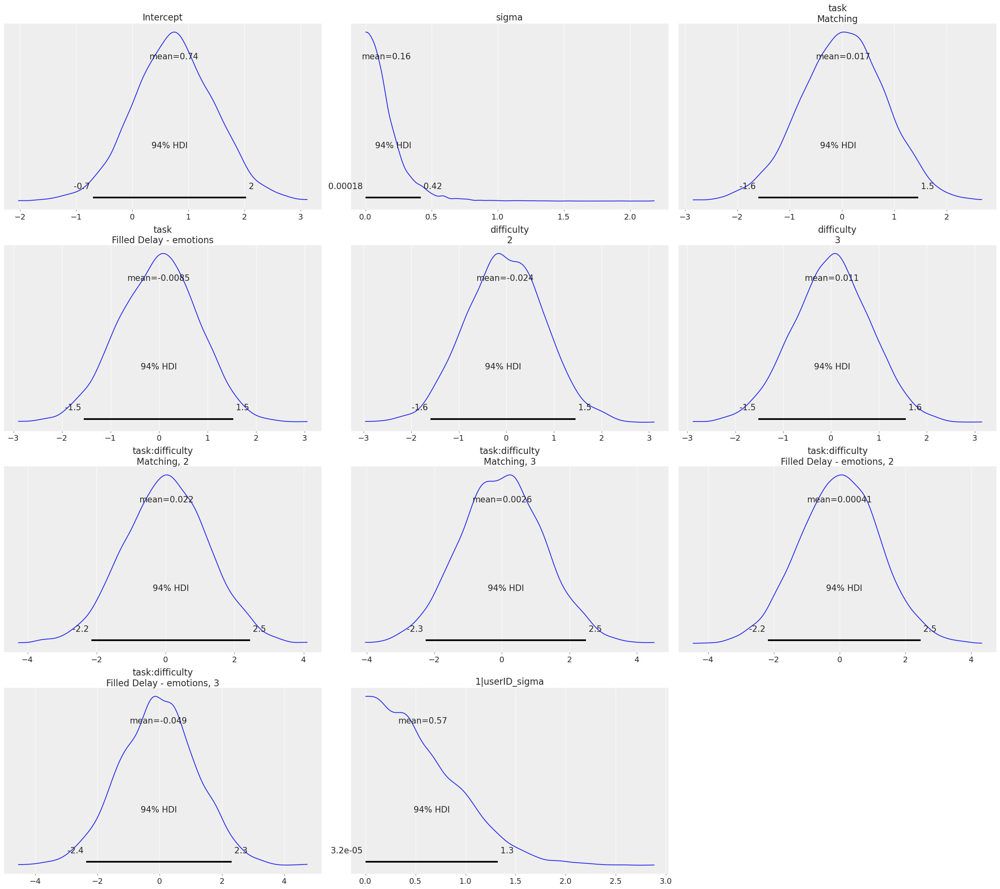

In [7]:
model_dic_bernoulli[f][formulas2run[0]].plot_priors()

Sampling: [1|userID_sigma, Intercept, difficulty, sigma, task]


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'task\nMatching'}>],
       [<Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': '1|userID_sigma'}>, <Axes: >, <Axes: >]],
      dtype=object)

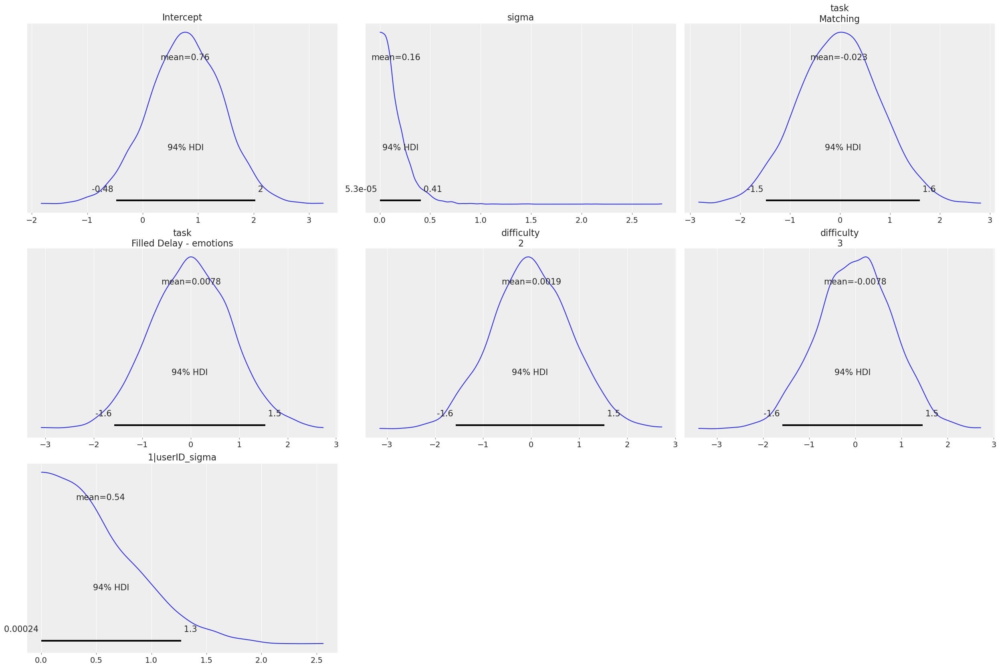

In [8]:
model_dic_bernoulli[f][formulas2run[1]].plot_priors()

### check posterior

array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task\nMatching'}>,
        <Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: >]], dtype=object)

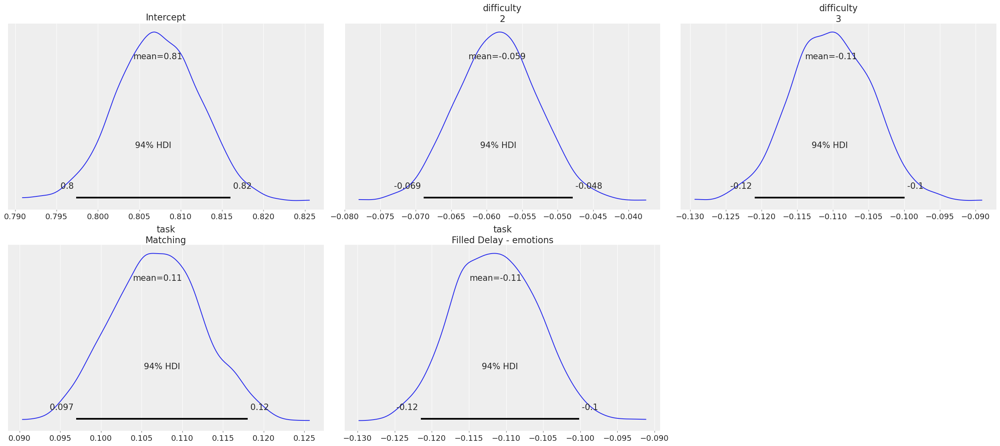

In [9]:
az.plot_posterior(result_dic_bernoulli[f][formulas2run[0]], 
                  var_names=['Intercept', 'difficulty', 'task'],#, 'task:difficulty'],
                  hdi_prob=.94)

array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task\nMatching'}>,
        <Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: >]], dtype=object)

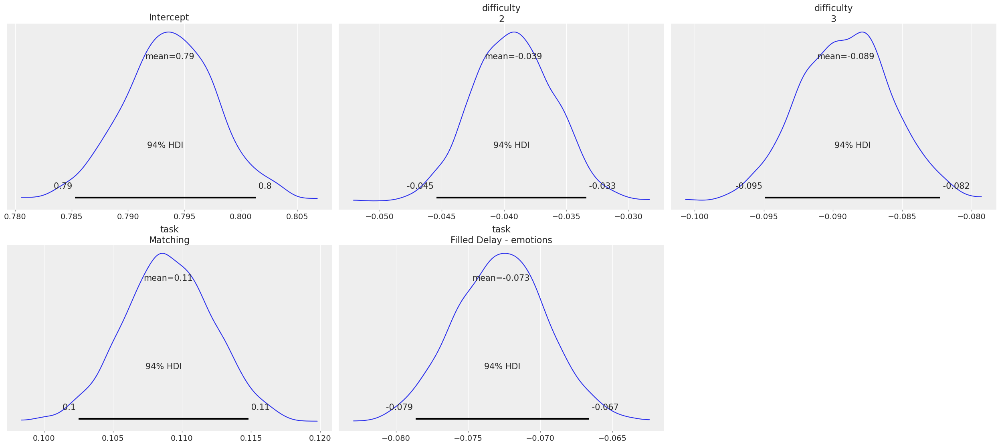

In [10]:
az.plot_posterior(result_dic_bernoulli[f][formulas2run[1]], 
                  var_names=['Intercept', 'difficulty', 'task'],#, 'task:difficulty'],
                  hdi_prob=.94)

---
## Plot results

## FMP dataset 1
[top](#top)


Dataset: dataset_1

Fitting formula correct_flt ~ task * difficulty + (1|userID)



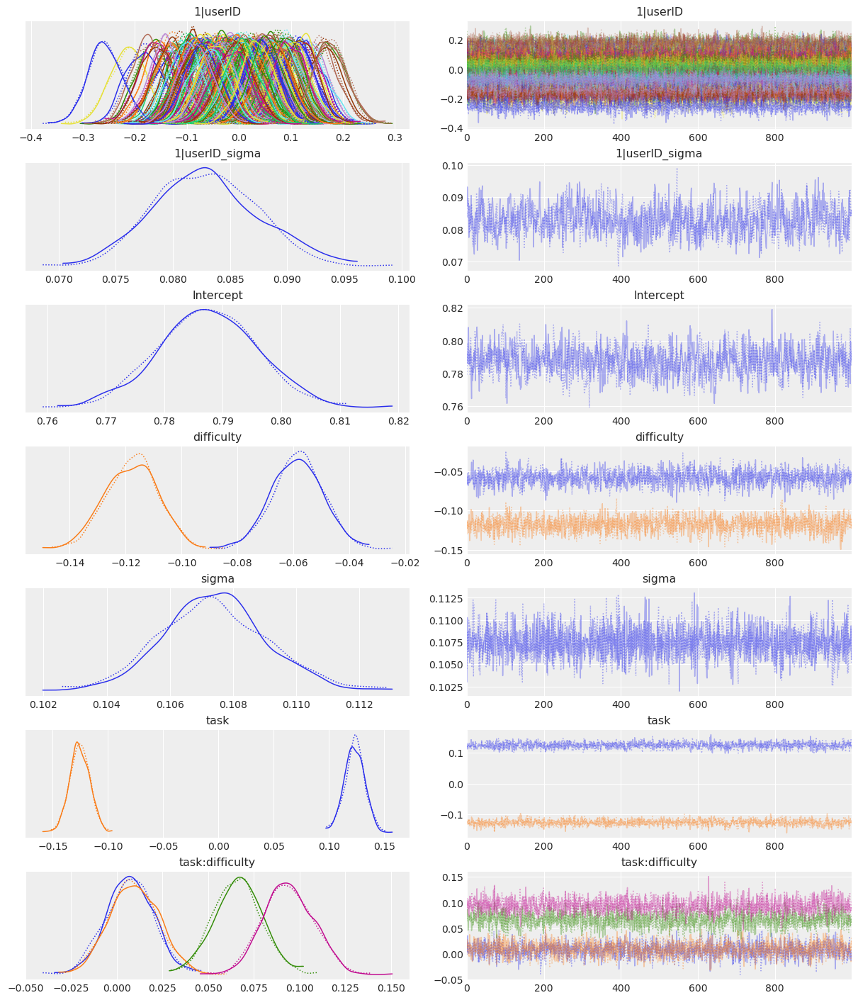

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_10]   -0.069  0.033  -0.129   -0.006      0.000    0.000    4313.0   
1|userID[s_1003] -0.076  0.034  -0.138   -0.015      0.001    0.000    4428.0   
1|userID[s_1005] -0.091  0.034  -0.155   -0.028      0.001    0.000    4459.0   
1|userID[s_1007]  0.040  0.034  -0.023    0.105      0.001    0.001    4581.0   
1|userID[s_1008] -0.114  0.032  -0.174   -0.056      0.001    0.000    3202.0   
1|userID[s_1009] -0.025  0.033  -0.088    0.036      0.001    0.001    3138.0   
1|userID[s_1012]  0.033  0.033  -0.025    0.094      0.001    0.001    3574.0   
1|userID[s_1013]  0.058  0.033  -0.004    0.119      0.001    0.000    3473.0   
1|userID[s_1014] -0.064  0.034  -0.129   -0.001      0.001    0.001    3611.0   
1|userID[s_102]   0.010  0.034  -0.050    0.078      0.001    0.001    3708.0   
1|userID[s_1027] -0.099  0.033  -0.164   -0.040      0.001    0.000    3550.0   
1|userID[s_1033] -0.029  0.0

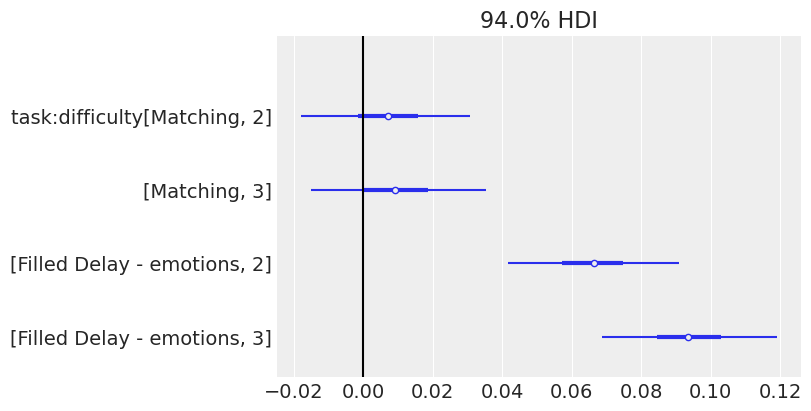

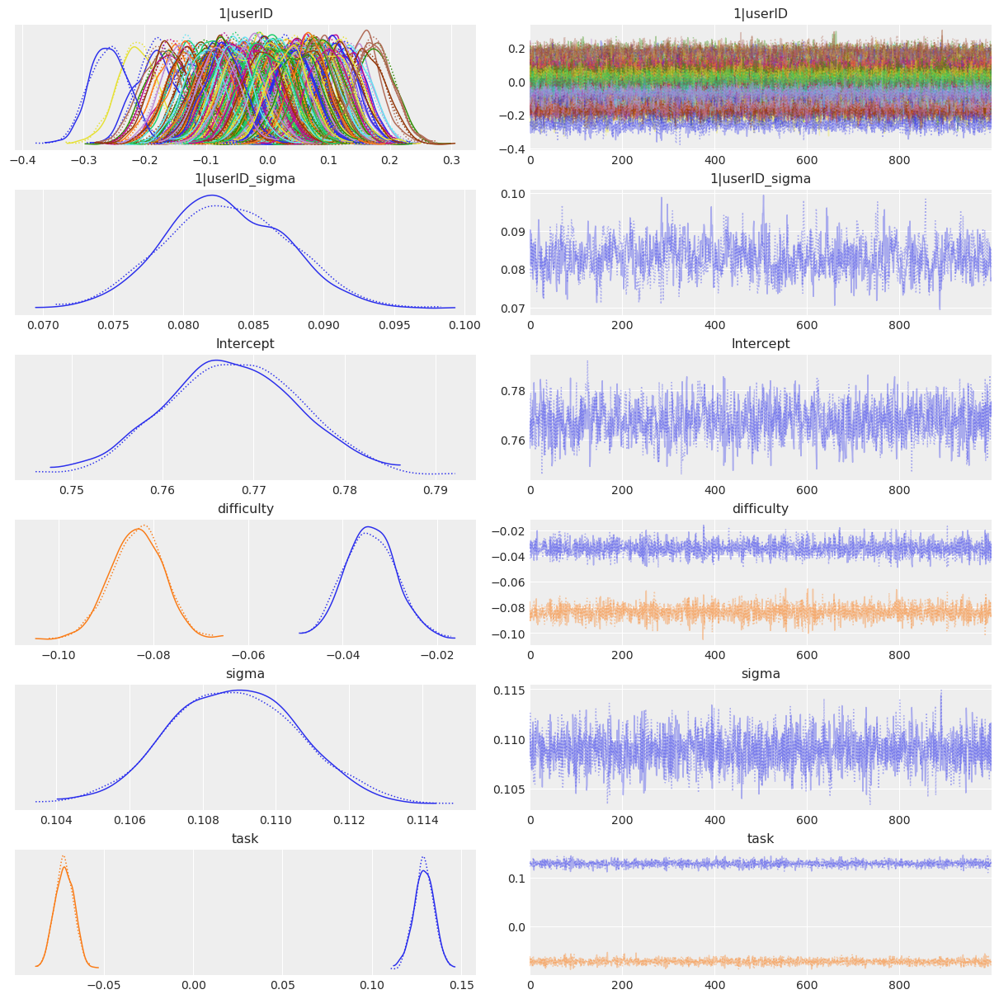

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_10]   -0.068  0.034  -0.130   -0.007      0.001    0.000    2946.0   
1|userID[s_1003] -0.077  0.034  -0.140   -0.012      0.001    0.000    3546.0   
1|userID[s_1005] -0.092  0.034  -0.153   -0.027      0.001    0.000    3498.0   
1|userID[s_1007]  0.039  0.034  -0.022    0.102      0.001    0.001    3338.0   
1|userID[s_1008] -0.113  0.034  -0.170   -0.044      0.001    0.000    2810.0   
1|userID[s_1009] -0.026  0.034  -0.091    0.037      0.001    0.001    2963.0   
1|userID[s_1012]  0.032  0.032  -0.028    0.093      0.001    0.001    3234.0   
1|userID[s_1013]  0.058  0.033  -0.003    0.122      0.001    0.001    3255.0   
1|userID[s_1014] -0.063  0.033  -0.130   -0.008      0.001    0.000    3773.0   
1|userID[s_102]   0.011  0.033  -0.048    0.074      0.001    0.001    3473.0   
1|userID[s_1027] -0.100  0.035  -0.165   -0.036      0.001    0.000    4312.0   
1|userID[s_1033] -0.027  0.0

In [11]:
f = 'dataset_1'
print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP dataset 2 -- randomised stimuli matched for entropy
[top](#top)


Dataset: dataset_2

Fitting formula correct_flt ~ task * difficulty + (1|userID)



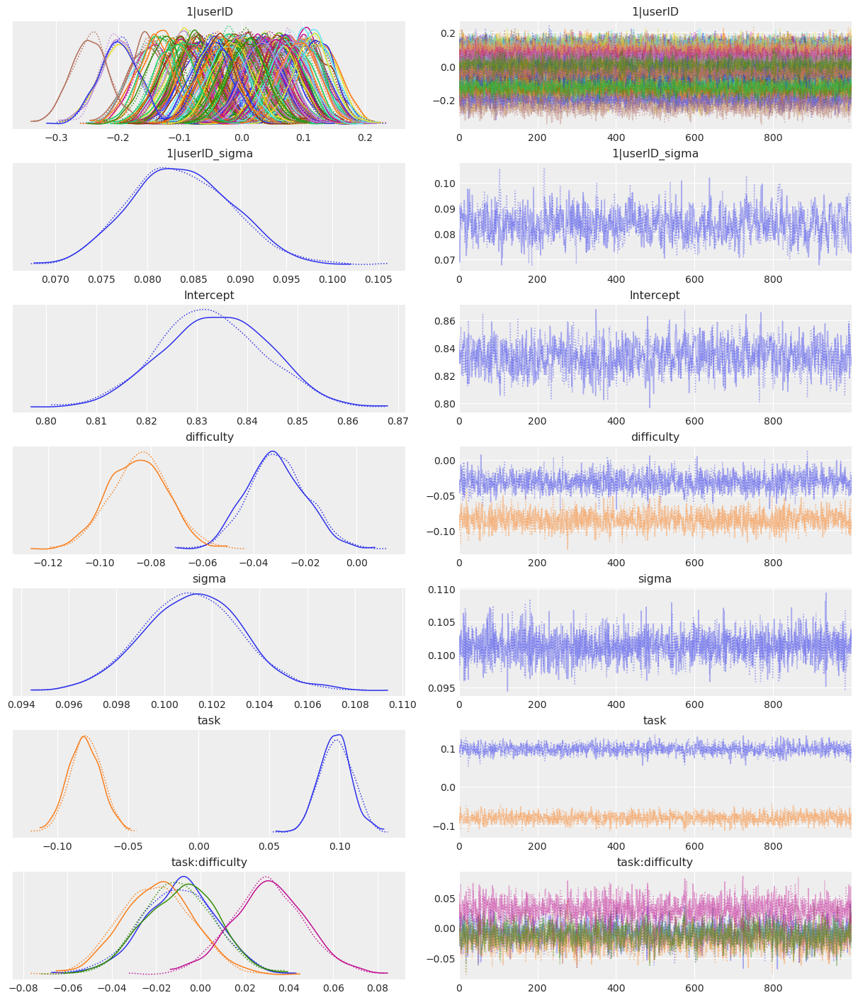

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.105  0.031   0.049    0.164      0.000    0.000    3969.0   
1|userID[s_1006] -0.029  0.033  -0.093    0.031      0.001    0.001    4102.0   
1|userID[s_101]   0.033  0.032  -0.026    0.092      0.001    0.001    2699.0   
1|userID[s_1025]  0.100  0.032   0.034    0.155      0.001    0.000    3390.0   
1|userID[s_1026]  0.022  0.031  -0.039    0.077      0.001    0.001    3500.0   
1|userID[s_1041] -0.102  0.032  -0.161   -0.042      0.001    0.000    3161.0   
1|userID[s_1044] -0.083  0.033  -0.146   -0.025      0.001    0.000    3463.0   
1|userID[s_1047]  0.049  0.032  -0.010    0.108      0.000    0.000    4245.0   
1|userID[s_1048]  0.018  0.031  -0.042    0.075      0.001    0.001    3536.0   
1|userID[s_1050]  0.003  0.032  -0.062    0.063      0.001    0.001    3618.0   
1|userID[s_1051]  0.056  0.033  -0.006    0.121      0.001    0.000    3624.0   
1|userID[s_1070] -0.028  0.0

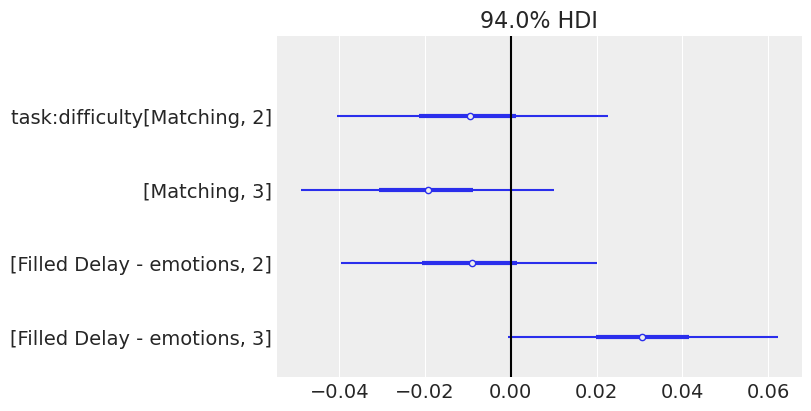

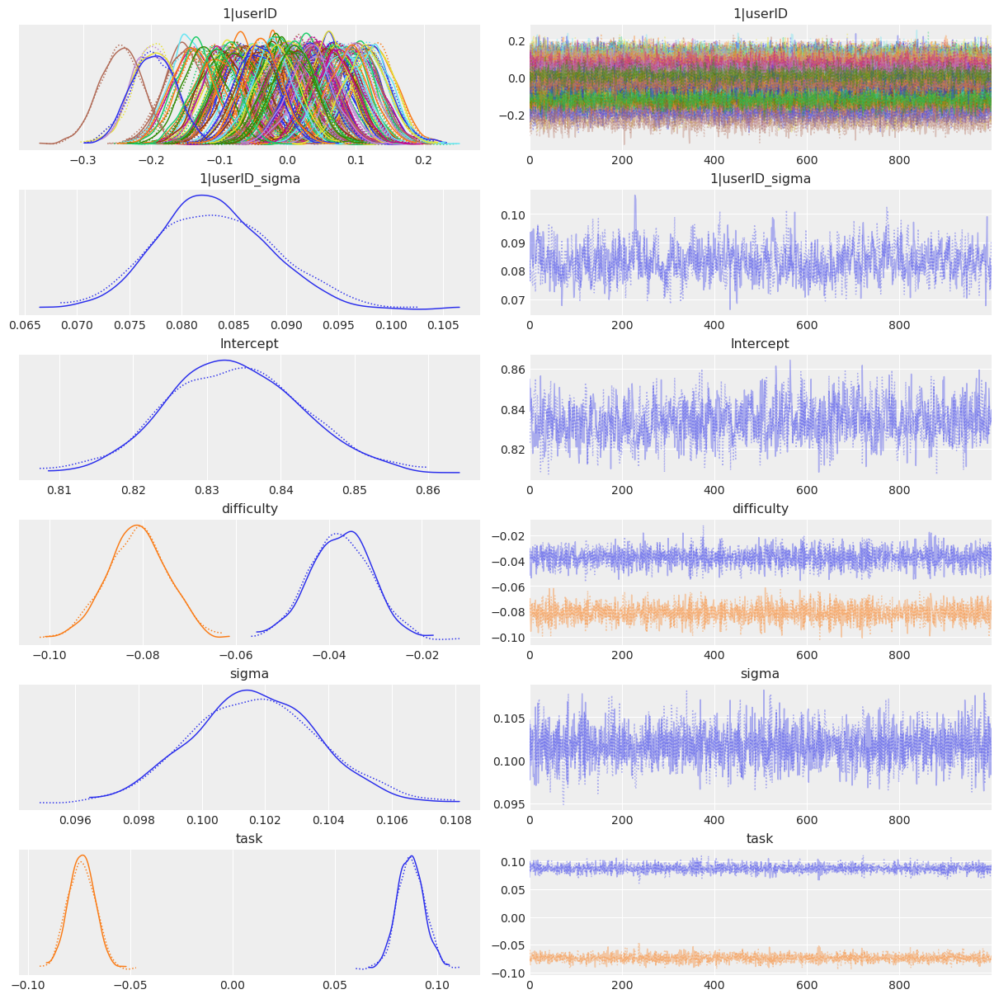

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.104  0.033   0.045    0.170      0.001    0.000    3724.0   
1|userID[s_1006] -0.028  0.033  -0.094    0.030      0.001    0.001    3562.0   
1|userID[s_101]   0.032  0.032  -0.025    0.091      0.001    0.001    3372.0   
1|userID[s_1025]  0.100  0.033   0.037    0.163      0.001    0.000    3210.0   
1|userID[s_1026]  0.024  0.032  -0.039    0.082      0.001    0.001    3767.0   
1|userID[s_1041] -0.101  0.032  -0.160   -0.043      0.001    0.000    3772.0   
1|userID[s_1044] -0.082  0.032  -0.138   -0.019      0.000    0.000    4377.0   
1|userID[s_1047]  0.050  0.033  -0.012    0.110      0.001    0.000    3809.0   
1|userID[s_1048]  0.018  0.031  -0.039    0.081      0.001    0.001    2557.0   
1|userID[s_1050]  0.005  0.033  -0.052    0.069      0.001    0.001    2972.0   
1|userID[s_1051]  0.058  0.031  -0.001    0.117      0.001    0.000    3417.0   
1|userID[s_1070] -0.025  0.0

In [12]:
f = 'dataset_2'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP dataset 3 -- randomising cue stimulus 
[top](#top)

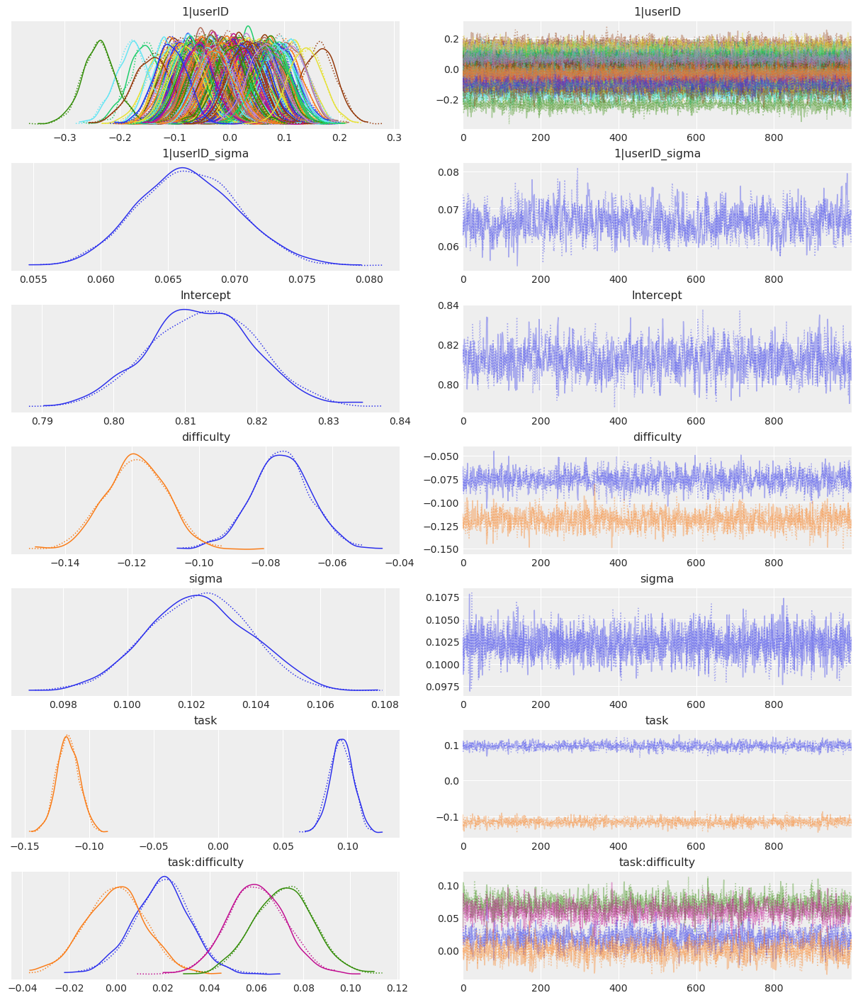

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1000]  0.023  0.032  -0.037    0.080      0.000    0.001    4713.0   
1|userID[s_1001]  0.002  0.035  -0.064    0.064      0.001    0.001    3785.0   
1|userID[s_1002] -0.097  0.030  -0.152   -0.040      0.000    0.000    3647.0   
1|userID[s_1004] -0.029  0.030  -0.087    0.023      0.000    0.001    4272.0   
1|userID[s_1019] -0.088  0.031  -0.144   -0.028      0.001    0.000    3156.0   
1|userID[s_1021] -0.051  0.031  -0.108    0.010      0.001    0.000    3463.0   
1|userID[s_1023]  0.047  0.029  -0.007    0.102      0.001    0.000    3262.0   
1|userID[s_1028]  0.080  0.030   0.026    0.139      0.001    0.000    3430.0   
1|userID[s_1029]  0.009  0.031  -0.046    0.069      0.000    0.001    3923.0   
1|userID[s_105]   0.065  0.031   0.008    0.122      0.001    0.000    3659.0   
1|userID[s_1054] -0.068  0.031  -0.125   -0.012      0.000    0.000    4456.0   
1|userID[s_1064]  0.101  0.0

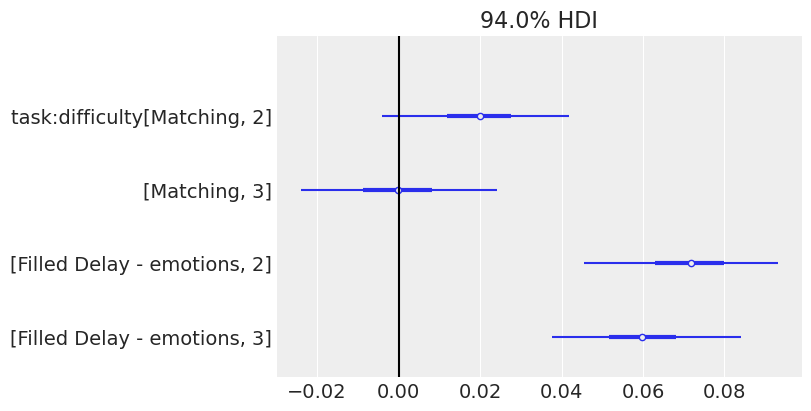

In [13]:
f = 'dataset_3'
print_model(model_dic_bernoulli[f][formulas2run[0]], result_dic_bernoulli[f][formulas2run[0]])

Dataset: dataset_3

Fitting formula correct_flt ~ task * difficulty + (1|userID)



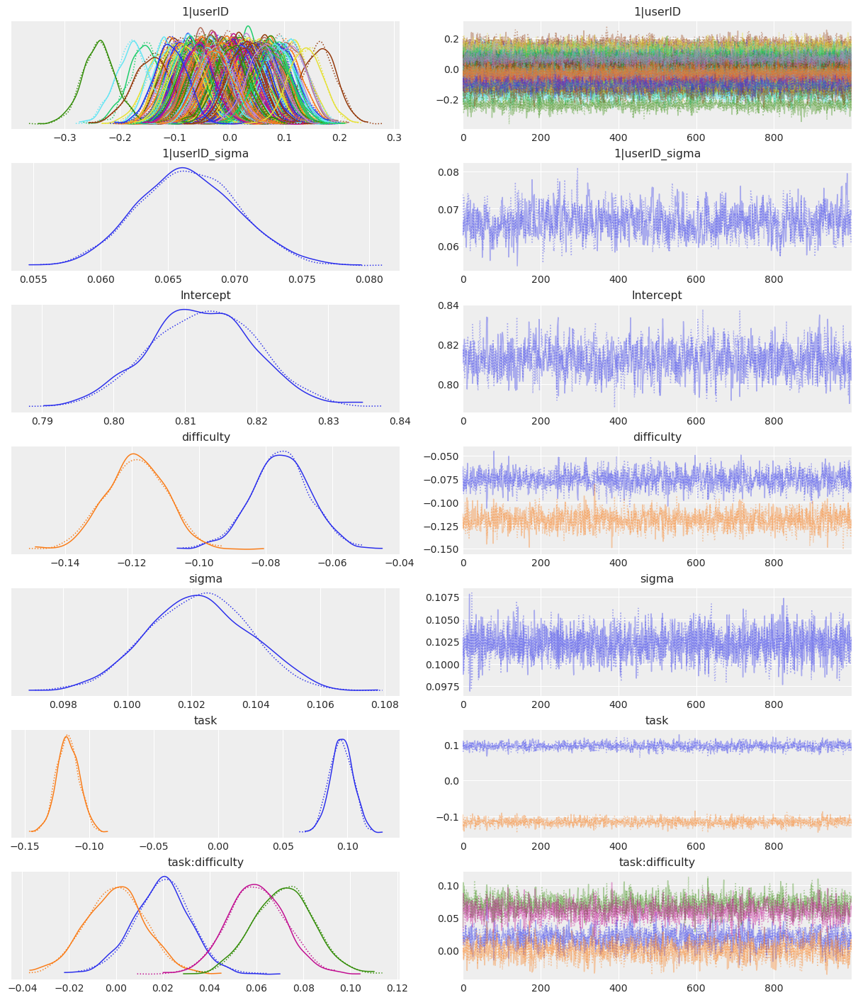

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1000]  0.023  0.032  -0.037    0.080      0.000    0.001    4713.0   
1|userID[s_1001]  0.002  0.035  -0.064    0.064      0.001    0.001    3785.0   
1|userID[s_1002] -0.097  0.030  -0.152   -0.040      0.000    0.000    3647.0   
1|userID[s_1004] -0.029  0.030  -0.087    0.023      0.000    0.001    4272.0   
1|userID[s_1019] -0.088  0.031  -0.144   -0.028      0.001    0.000    3156.0   
1|userID[s_1021] -0.051  0.031  -0.108    0.010      0.001    0.000    3463.0   
1|userID[s_1023]  0.047  0.029  -0.007    0.102      0.001    0.000    3262.0   
1|userID[s_1028]  0.080  0.030   0.026    0.139      0.001    0.000    3430.0   
1|userID[s_1029]  0.009  0.031  -0.046    0.069      0.000    0.001    3923.0   
1|userID[s_105]   0.065  0.031   0.008    0.122      0.001    0.000    3659.0   
1|userID[s_1054] -0.068  0.031  -0.125   -0.012      0.000    0.000    4456.0   
1|userID[s_1064]  0.101  0.0

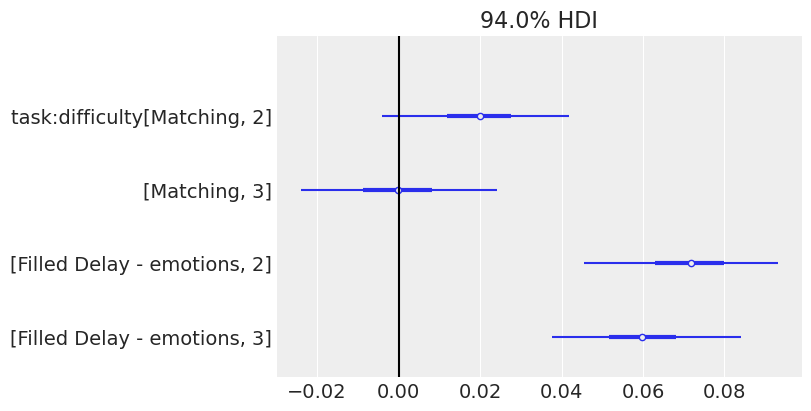

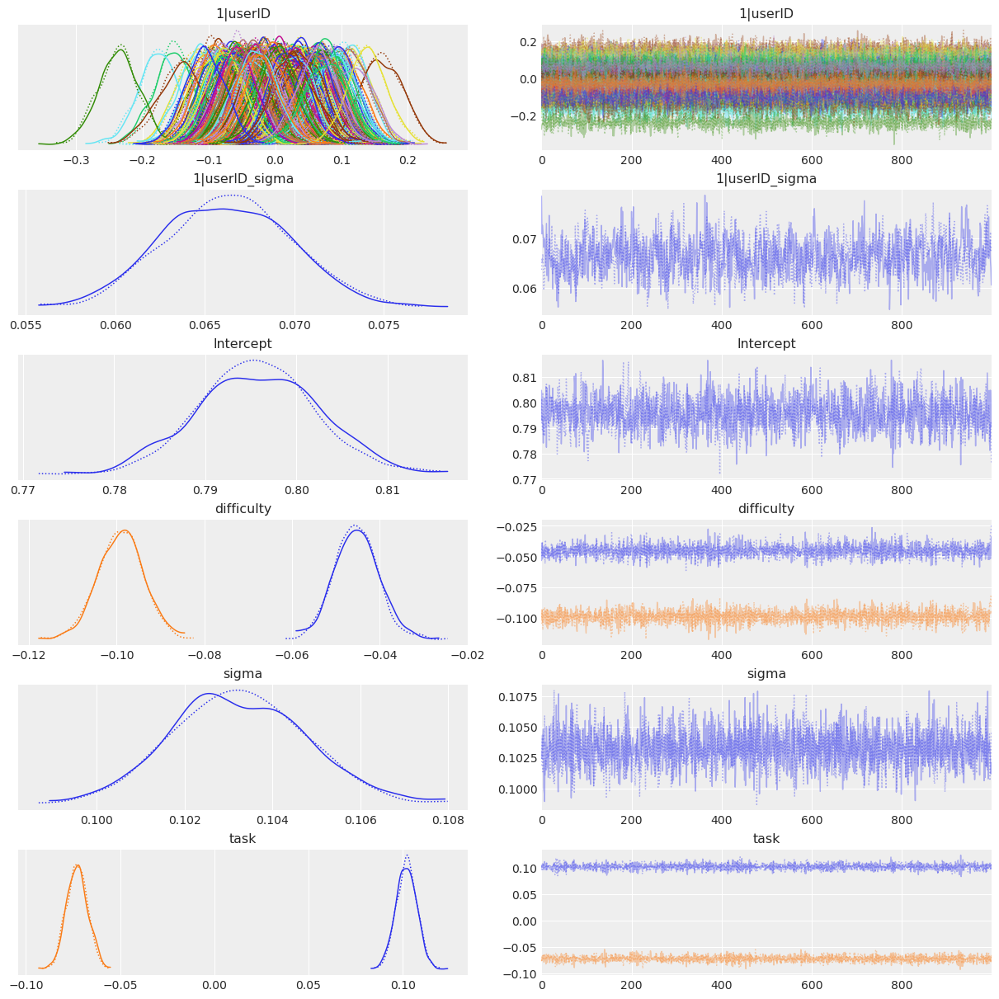

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1000]  0.024  0.031  -0.035    0.080      0.001    0.001    3256.0   
1|userID[s_1001]  0.003  0.035  -0.055    0.072      0.001    0.001    4570.0   
1|userID[s_1002] -0.096  0.030  -0.148   -0.035      0.000    0.000    4010.0   
1|userID[s_1004] -0.028  0.030  -0.082    0.029      0.000    0.001    4422.0   
1|userID[s_1019] -0.087  0.030  -0.142   -0.030      0.000    0.000    3671.0   
1|userID[s_1021] -0.051  0.031  -0.111    0.004      0.001    0.000    3835.0   
1|userID[s_1023]  0.047  0.031  -0.011    0.109      0.001    0.000    3650.0   
1|userID[s_1028]  0.079  0.032   0.016    0.137      0.001    0.000    3537.0   
1|userID[s_1029]  0.010  0.030  -0.046    0.065      0.000    0.001    3878.0   
1|userID[s_105]   0.064  0.031   0.005    0.121      0.000    0.000    4392.0   
1|userID[s_1054] -0.066  0.030  -0.125   -0.014      0.000    0.000    3917.0   
1|userID[s_1064]  0.101  0.0

In [14]:
f = 'dataset_3'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP concatenated dataset 1, 2, 3
[top](#top)


Dataset: concat_datasets_123

Fitting formula correct_flt ~ task * difficulty + (1|userID)



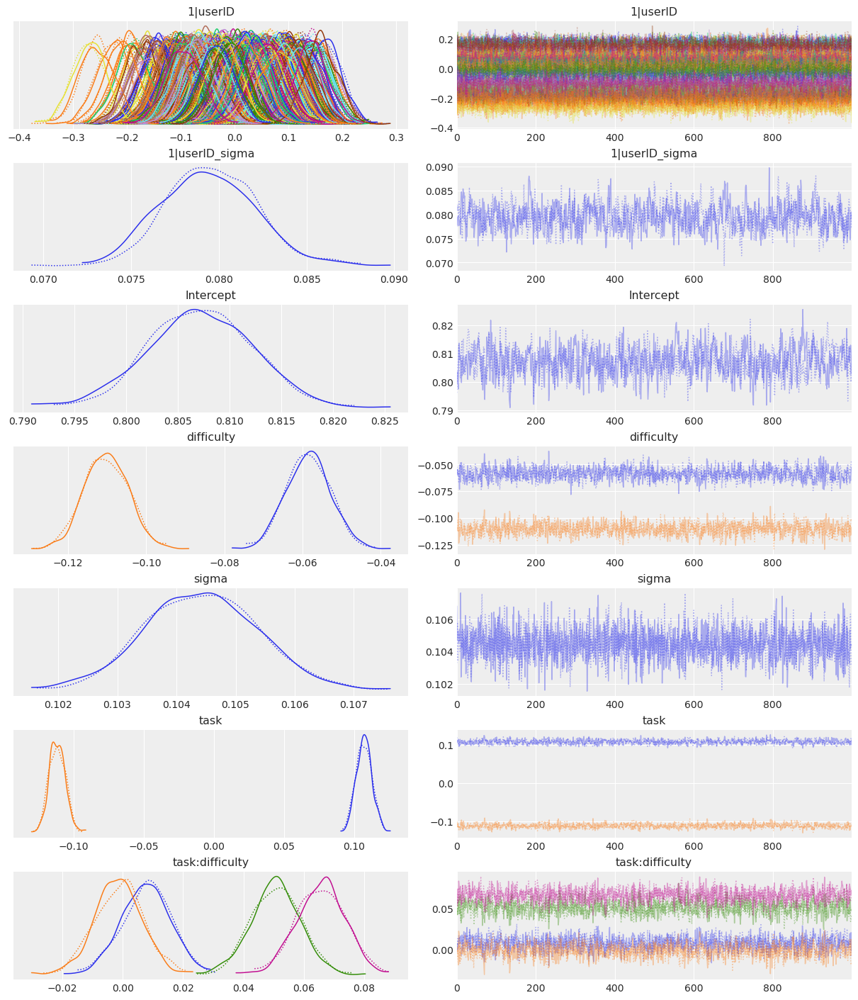

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.134  0.030   0.080    0.195      0.001    0.000    3335.0   
1|userID[s_10]   -0.081  0.033  -0.136   -0.014      0.001    0.000    2912.0   
1|userID[s_1000]  0.019  0.032  -0.038    0.084      0.000    0.001    4311.0   
1|userID[s_1001] -0.002  0.038  -0.076    0.066      0.001    0.001    3639.0   
1|userID[s_1002] -0.108  0.032  -0.170   -0.047      0.001    0.000    2955.0   
1|userID[s_1003] -0.090  0.032  -0.150   -0.030      0.000    0.000    4283.0   
1|userID[s_1004] -0.034  0.031  -0.093    0.021      0.001    0.001    3345.0   
1|userID[s_1005] -0.104  0.032  -0.166   -0.048      0.001    0.000    3739.0   
1|userID[s_1006]  0.003  0.032  -0.058    0.064      0.001    0.001    3505.0   
1|userID[s_1007]  0.027  0.032  -0.035    0.086      0.001    0.001    3532.0   
1|userID[s_1008] -0.126  0.031  -0.187   -0.068      0.000    0.000    4084.0   
1|userID[s_1009] -0.039  0.0

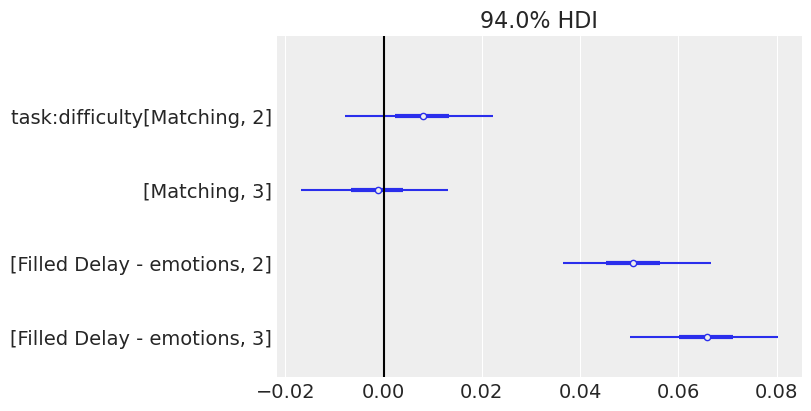

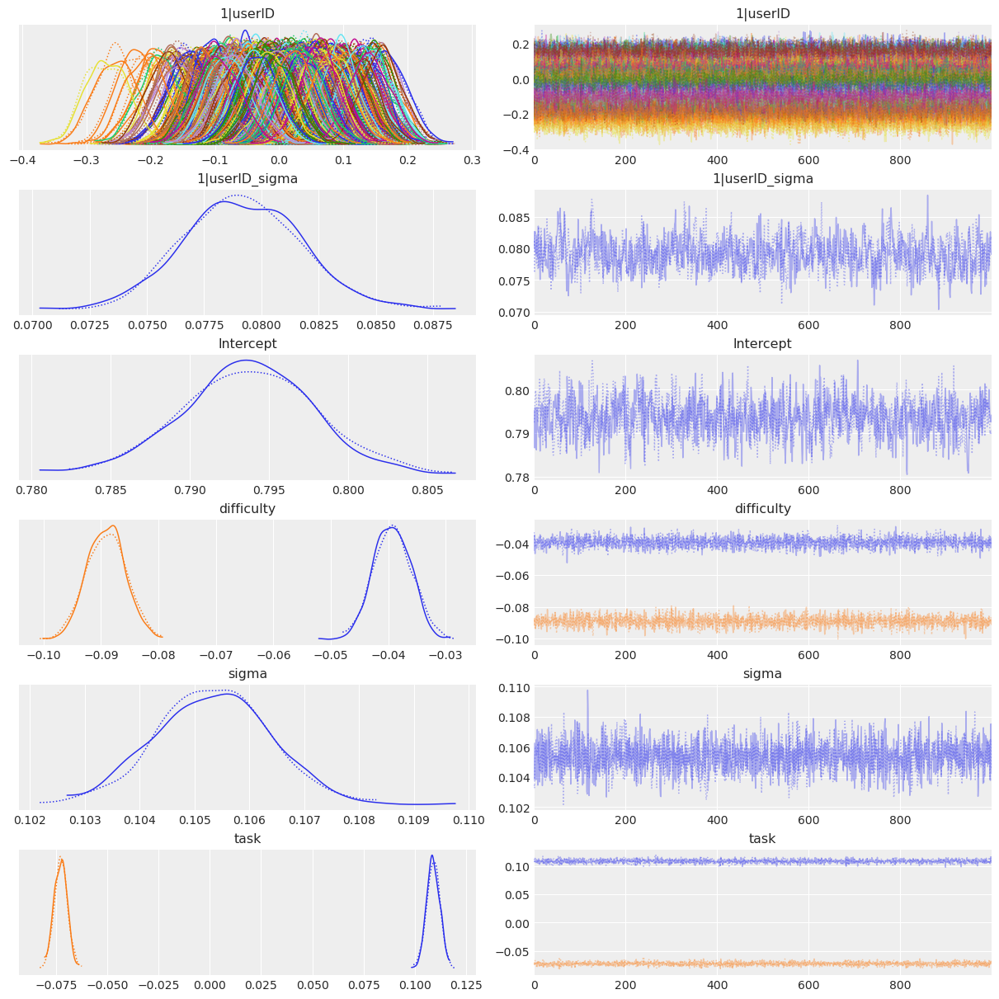

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.133  0.032   0.073    0.194      0.001    0.000    3781.0   
1|userID[s_10]   -0.080  0.031  -0.135   -0.019      0.001    0.000    3261.0   
1|userID[s_1000]  0.021  0.032  -0.039    0.082      0.001    0.001    3942.0   
1|userID[s_1001] -0.002  0.038  -0.075    0.066      0.001    0.001    2932.0   
1|userID[s_1002] -0.108  0.031  -0.162   -0.046      0.001    0.000    2927.0   
1|userID[s_1003] -0.088  0.033  -0.153   -0.029      0.001    0.000    3363.0   
1|userID[s_1004] -0.034  0.033  -0.094    0.030      0.000    0.001    4490.0   
1|userID[s_1005] -0.104  0.030  -0.165   -0.052      0.001    0.000    3280.0   
1|userID[s_1006]  0.003  0.034  -0.057    0.071      0.001    0.001    3198.0   
1|userID[s_1007]  0.027  0.034  -0.037    0.086      0.001    0.001    3445.0   
1|userID[s_1008] -0.126  0.032  -0.180   -0.061      0.001    0.000    3043.0   
1|userID[s_1009] -0.039  0.0

In [15]:
f = 'concat_datasets_123'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

### Compare all data
[top](#top)

dataset_1 

                                              rank     elpd_loo       p_loo  \
correct_flt ~ task * difficulty + (1|userID)     0  1768.739634  219.284666   
correct_flt ~ task + difficulty + (1|userID)     1  1739.998581  214.079044   

                                              elpd_diff    weight         se  \
correct_flt ~ task * difficulty + (1|userID)   0.000000  0.874144  34.082427   
correct_flt ~ task + difficulty + (1|userID)  28.741052  0.125856  34.368006   

                                                   dse  warning scale  
correct_flt ~ task * difficulty + (1|userID)  0.000000    False   log  
correct_flt ~ task + difficulty + (1|userID)  8.800018    False   log  

dataset_2 

                                              rank     elpd_loo       p_loo  \
correct_flt ~ task * difficulty + (1|userID)     0  1126.491054  135.241571   
correct_flt ~ task + difficulty + (1|userID)     1  1122.287022  132.167769   

                                          

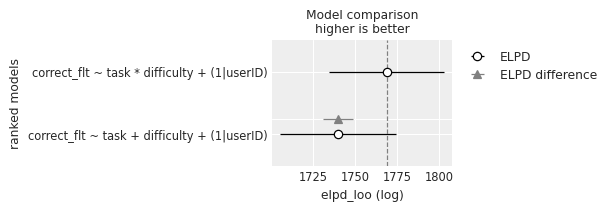

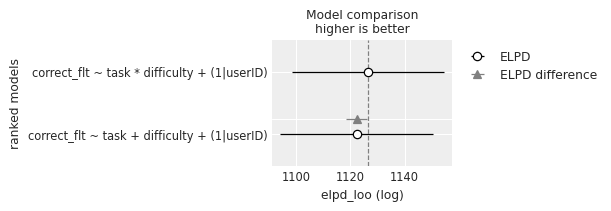

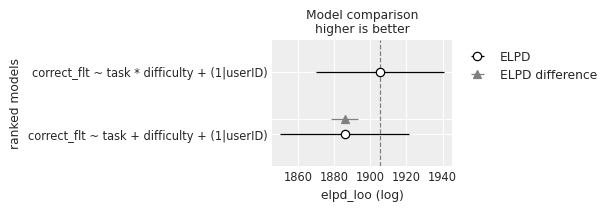

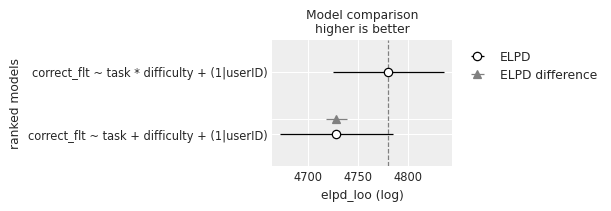

In [16]:
df_compare_formulas_bernoulli = {}
for f in result_dic_bernoulli.keys():
    print(f, '\n')
    df_compare_formulas_bernoulli[f] = az.compare(result_dic_bernoulli[f])
    
    print(df_compare_formulas_bernoulli[f])
    
    az.plot_compare(df_compare_formulas_bernoulli[f], insample_dev=False);

    
    print()
# df_compare_formulas_bernoulli[f]

Text(0.5, 0.98, 'Model comparison\nhigher is better')

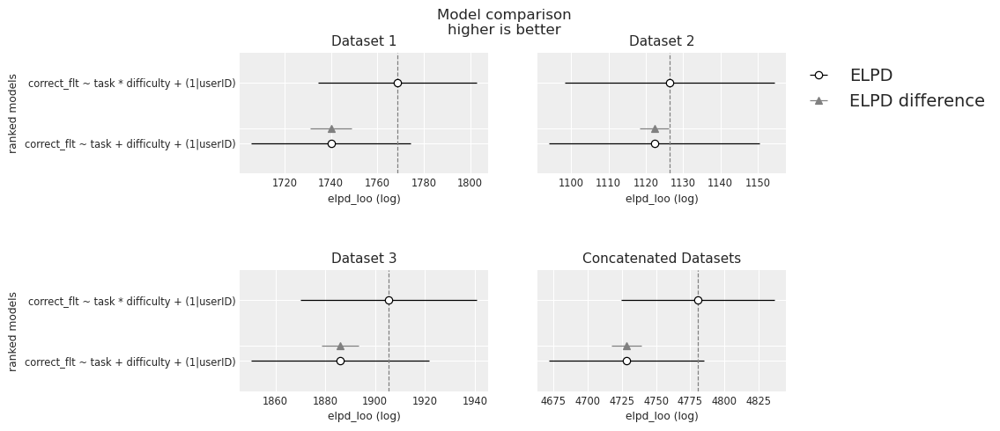

In [17]:
fig, axs = plt.subplots(2,2, figsize=(8,5), sharey=True, constrained_layout=False)
plt.subplots_adjust(hspace=0.8)

for (i,f),ax in zip(enumerate(df_compare_formulas_bernoulli.keys()), axs.flatten()):
    az.plot_compare(df_compare_formulas_bernoulli[f], insample_dev=False, ax=ax)
    
    if i==1:
        ax.legend(bbox_to_anchor=(1,1))
    else:
        ax.legend_.remove()

    if i%2==1:
        ax.set_ylabel('')
        
    t = ax.get_title()
    ax.set_title(f.replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title(), fontsize=11)
    
plt.suptitle(t)

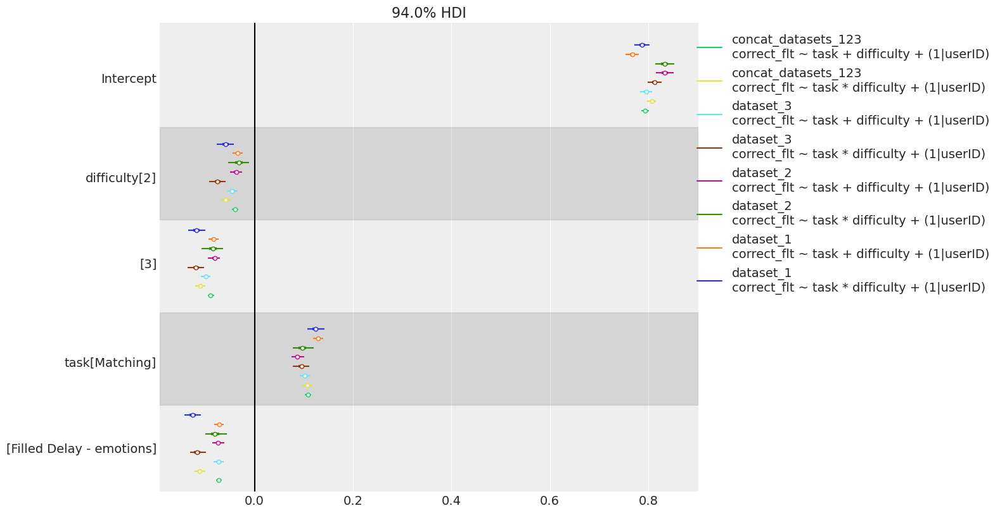

In [18]:
fig, ax = plt.subplots(figsize=(14, 8))

az.plot_forest(
    list(result_dic_bernoulli['dataset_1'].values())+\
    list(result_dic_bernoulli['dataset_2'].values())+\
    list(result_dic_bernoulli['dataset_3'].values())+\
    list(result_dic_bernoulli['concat_datasets_123'].values()),
    model_names=[f'{f}\n{formula}' for f in result_dic_bernoulli.keys() for formula in formulas2run],
    var_names=["Intercept", "difficulty", "task"],
    combined=True,
    ax=ax
)

ax.axvline(0, c='k')

# manually adjust the legend, there is some weird bug
legend = ax.get_legend()
labels = [] if legend is None else [str(x._text) for x in legend.texts]
handles = [] if legend is None else legend.legend_handles
ax.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.56, 1), ncols=1)
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()



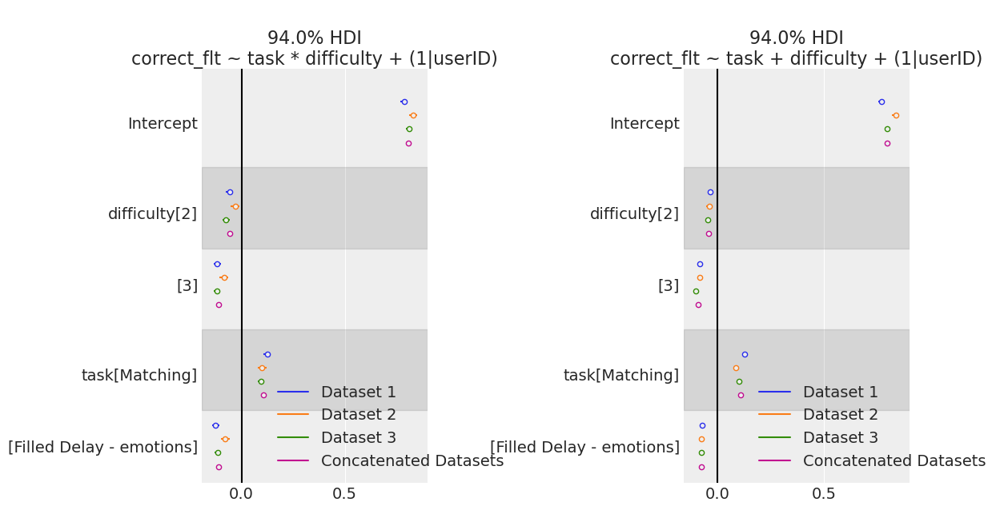

In [19]:
fig, axs = plt.subplots(1,2, figsize=(12, 6))

for i, ax in enumerate(axs.flatten()):
    az.plot_forest(
        (list(result_dic_bernoulli['dataset_1'].values())+\
        list(result_dic_bernoulli['dataset_2'].values())+\
        list(result_dic_bernoulli['dataset_3'].values())+\
        list(result_dic_bernoulli['concat_datasets_123'].values())
    )[i::2],
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["Intercept", "difficulty", "task"],
        combined=True,
        ax=ax
    )
        
    ax.set_title(f'{ax.get_title()}\n{formulas2run[i]}')

    ax.axvline(0, c='k')

    # manually adjust the legend, there is some weird bug
    legend = ax.get_legend()
    labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title() for x in legend.texts]
    handles = [] if legend is None else legend.legend_handles
    # reorder the legend
    ax.legend(handles[::-1], labels[::-1], loc="lower right", bbox_to_anchor=(1.4, 0))
    
    
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()



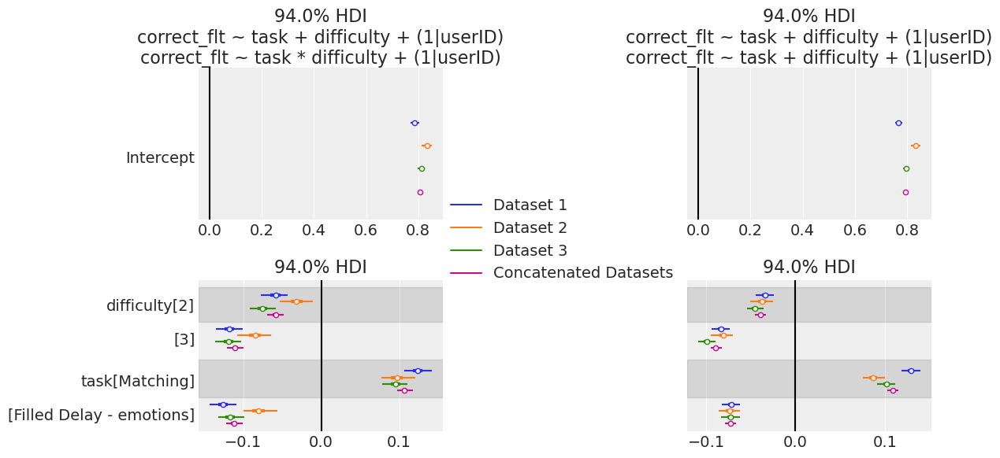

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(12, 6), sharey='row', constrained_layout=False)

plt.subplots_adjust(wspace=1., hspace=0.4)

for i in range(2):

    models = (
        list(result_dic_bernoulli['dataset_1'].values()) +
        list(result_dic_bernoulli['dataset_2'].values()) +
        list(result_dic_bernoulli['dataset_3'].values()) +
        list(result_dic_bernoulli['concat_datasets_123'].values())
    )[i::2]

    # Plot 'Intercept' separately
    az.plot_forest(
        models,  # Only Intercept
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["Intercept"],
        combined=True,
        ax=axs[0,i]
    )

    # Plot other variables
    az.plot_forest(
        models,
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["difficulty", "task"],
        combined=True,
        ax=axs[1,i]
    )

    axs[0,i].set_title(f'{ax.get_title()}\n{formulas2run[i]}')
    
    
for i, ax in enumerate(axs.flatten()):
    ax.axvline(0, c='k')
    
    if i==0:
        # Manually adjust the legend
        legend = ax.get_legend()
        labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_', ' ').title() for x in legend.texts]
        handles = [] if legend is None else legend.legend_handles
        ax.legend(handles[::-1], labels[::-1], loc="lower right", bbox_to_anchor=(2., -.5))
        
    else:
        ax.legend_.remove()

# # Add title and vertical line to the intercept subplot
# intercept_ax.set_title("Intercept")
# intercept_ax.axvline(0, c='k')

plt.show()


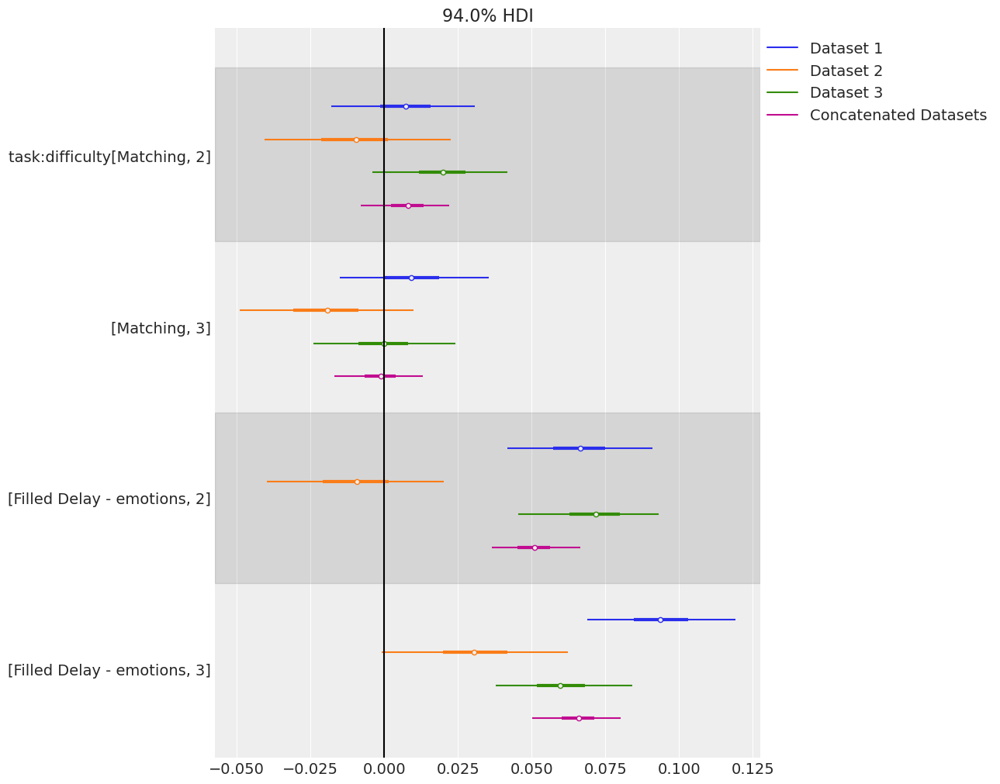

In [21]:

fig, ax = plt.subplots(figsize=(12, 10))

az.plot_forest(
    (list(result_dic_bernoulli['dataset_1'].values())+\
    list(result_dic_bernoulli['dataset_2'].values())+\
    list(result_dic_bernoulli['dataset_3'].values())+\
    list(result_dic_bernoulli['concat_datasets_123'].values())
    )[::2],
    model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
    var_names=["task:difficulty"],
    combined=True,
    ax=ax
)

ax.axvline(0, c='k')

# plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
# # plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
# plt.show()


# manually adjust the legend, there is some weird bug
legend = ax.get_legend()
labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title() for x in legend.texts]
handles = [] if legend is None else legend.legend_handles
ax.legend(handles[::-1], labels[::-1], loc="upper right", bbox_to_anchor=(1.44, 1))
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()

### Run some predictions
[top](#top)

In [22]:
interactions = ['Matching, 2', 'Matching, 3', 'Filled Delay - emotions, 2', 'Filled Delay - emotions, 3']
fm2, fm3, i2, i3 = [result_dic_bernoulli[f]['correct_flt ~ task * difficulty + (1|userID)'].posterior["task:difficulty"].sel({"task:difficulty_dim":tsk}) for tsk in interactions]



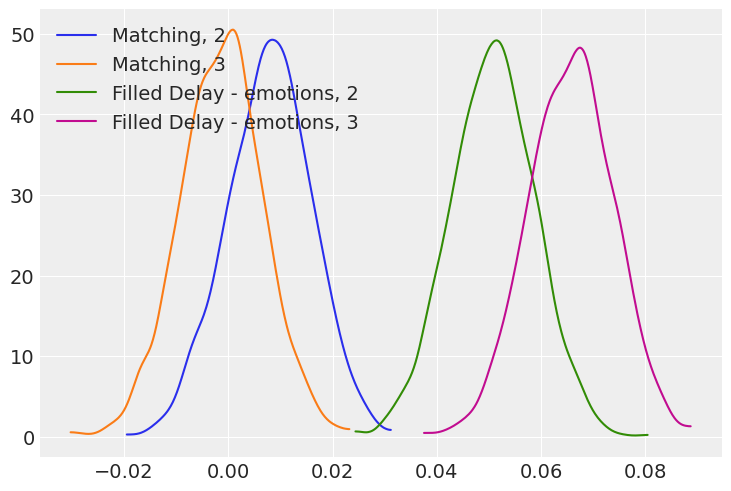

In [23]:
_, ax = plt.subplots()
for idx, x in enumerate([fm2, fm3, i2, i3]):
    az.plot_dist(x, label=x["task:difficulty_dim"].item(), plot_kwargs={"color": f"C{idx}"}, ax=ax)
ax.legend(loc="upper left");

In [24]:
# Probability that the FM slope is less than 0

print(f"""
Probability that the M slope is less than 0:
level 2: {(fm2 < 0).mean().item()}
level 3: {(fm3 < 0).mean().item()}
""")


Probability that the M slope is less than 0:
level 2: 0.17
level 3: 0.55



---

In [25]:
for f in result_dic_bernoulli.keys():

    fm2, fm3, i2, i3 = [result_dic_bernoulli[f]['correct_flt ~ task * difficulty + (1|userID)'].posterior["task:difficulty"].sel({"task:difficulty_dim":tsk}) for tsk in interactions]
    print(f"""
Experiment {f}:
  Probability that the M slope is less than 0:
    level 2: {(fm2 < 0).mean().item()}
    level 3: {(fm3 < 0).mean().item()}
    
  Probability that the FD-e slope is less than 0:
    level 2: {(i2 < 0).mean().item()}
    level 3: {(i3 < 0).mean().item()}
    
    """)


Experiment dataset_1:
  Probability that the M slope is less than 0:
    level 2: 0.2875
    level 3: 0.2455
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    

Experiment dataset_2:
  Probability that the M slope is less than 0:
    level 2: 0.7195
    level 3: 0.885
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.7185
    level 3: 0.0315
    
    

Experiment dataset_3:
  Probability that the M slope is less than 0:
    level 2: 0.0635
    level 3: 0.502
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    

Experiment concat_datasets_123:
  Probability that the M slope is less than 0:
    level 2: 0.17
    level 3: 0.55
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    


### Save the inference
[top](#top)

It could be possible to use this:
```
result_dic_bernoulli['dataset_1']['correct_flt ~ task * difficulty + (1|userID)'].to_netcdf()
```

and the other datasets that were fitted, but it doesn't preserve the dictionary, so I use pickle.

In [26]:
# save the dictionary to a pickle file
with open(opj(path_inference_data,'FMP_Figure_2_inference_data_dict.pkl'), 'wb') as f:
    pickle.dump(result_dic_bernoulli, f)

In [27]:
# # Load the dictionary from the pickle file
# with open(opj(path_inference_data,'FMP_Figure_2_inference_data_dict.pkl'), 'rb') as f:
#     loaded_inference_data_dict = pickle.load(f)


In [28]:
%load_ext watermark

%watermark -a 'Jan Kadlec' -nmvu -iv -iv -w -p pytensor


Author: Jan Kadlec

Last updated: Wed Feb 05 2025

Python implementation: CPython
Python version       : 3.12.5
IPython version      : 8.25.0

pytensor: 2.23.0

Compiler    : GCC 12.4.0
OS          : Linux
Release     : 5.14.0-427.42.1.el9_4.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 96
Architecture: 64bit

pandas    : 2.2.2
matplotlib: 3.9.2
bambi     : 0.14.0
arviz     : 0.19.0
sys       : 3.12.5 | packaged by conda-forge | (main, Aug  8 2024, 18:36:51) [GCC 12.4.0]
numpy     : 1.26.4

Watermark: 2.4.3



[top](#top)